# LRCN_MobileNet_STATEFUL

this notebook has been used to train the model for classification.
Crossvalidation has been used to test some parametres but hold-out validation has been used to train the final model

In [73]:
#https://github.com/okankop/vidaug
from vidaug import augmentors as va
import os
import cv2

import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt
 
from tensorflow.keras import regularizers
from sklearn.model_selection import train_test_split
 
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import MobileNetV3Small
# for google collab
#!pip install -q git+https://github.com/tensorflow/docs

import imageio
from tensorflow_docs.vis import embed
import random

# Declaration of the parametres

In [76]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 160, 160
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
# UFC
#SEQUENCE_LENGTH = 6
#SEQUENCE_PADDING = 5

#FIGHT
SEQUENCE_LENGTH = 15
SEQUENCE_PADDING = 2
 
# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = "UFC160"
# fight dataset
#DATASET_DIR = "FightDataset"

#DATASET_DIR = "HomeMadeDataset"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
CLASSES_LIST = ["ras", "suspect"]

#CLASSES_LIST = ["fight", "noFight"]

In [77]:
BATCH_SIZE = 1

In [78]:
# Normalisation used by mobilenet
def normalizeMobile(img):
    return (img / 127.5) - 1

def unnormalizeMobile(img):
    return ((img + 1.) * 127.5).astype(np.uint8)

In [79]:
# this method extract frame with a padding between each frame
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''
    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    #skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    frames_list = []

    for frame_counter in range(0, video_frames_count, SEQUENCE_PADDING):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter)

        # Reading the frame from the video. 
        success, frame = video_reader.read() 

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Append the normalized frame into the frames list
        frames_list.append(frame)
    
    # Release the VideoCapture object. 
    video_reader.release()

    frames_list = np.array(frames_list)

    # Return the frames list.
    return frames_list

In [80]:
# Find all the file and create a dataset comopsed of the label and the file name
def create_dataset(CLASSES_LIST, DATASET_DIR):
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        random.shuffle(files_list)
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)
                # Append the data to their repective lists.
            features.append(video_file_path)
            labels.append(class_index)


    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  
    
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

In [81]:
# Create the dataset.
features, labels, video_files_paths = create_dataset(CLASSES_LIST,DATASET_DIR)

Extracting Data of Class: ras
Extracting Data of Class: suspect


In [82]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)
features.shape

(627,)

In [83]:
# This cell is used to egalise the number of class 1 and 2
labels = one_hot_encoded_labels[:,0]

unique, counts = np.unique(labels, return_counts=True)
print(unique)
print(counts)

features_1 = features[labels==0]
features_2 = features[labels==1]
features_1 = features_1[:148]
features_2 = features_2[:148]

label_1 = np.zeros(len(features_1))
label_2 = np.ones(len(features_2))
features = np.append(features_1, features_2)
labels = np.append(label_1, label_2)

print(labels)

[0. 1.]
[118 509]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1.]


In [84]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
X_train, X_test, labels_train, labels_test = train_test_split(features, labels, test_size = 0.10, shuffle = True)


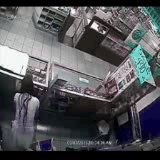

In [85]:
full_vid = frames_extraction(X_train[1])
imageio.mimsave("animation_real.gif",full_vid , fps=20)
embed.embed_file("animation_real.gif")


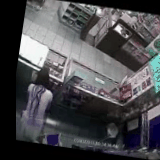

In [86]:
# Data augmentation pipeline
sometimes = lambda aug: va.Sometimes(0.4, aug) # Used to apply augmentor with 66% probability
augmentation_pipeline = va.Sequential([va.RandomRotate(degrees=30), # randomly rotates the video with a degree randomly choosen from [-10, 10]  
    sometimes(va.HorizontalFlip()), # horizontally flip the video with 50% probability
    va.RandomTranslate(20),
    sometimes(va.Downsample(0.5)),
    sometimes(va.Upsample(1.))                               
    ])

video_aug = augmentation_pipeline(full_vid)
imageio.mimsave("animation_real.gif",(np.array(video_aug)*255).astype(np.uint8), fps=20)
embed.embed_file("animation_real.gif")

In [87]:
print(X_train.shape)
print(X_test.shape)
print(labels_train.shape)
print(labels_test.shape)

(239,)
(27,)
(239,)
(27,)


# Declaration of the models

In [88]:
def create_conv2dconv3d_model(nb_frozen=102):
    '''
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    '''

    # We will use a Sequential model for model construction
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################
    
    # with auto encoder preprocessed weight
    #base_model = tf.keras.models.load_model('Weights/mobil160.h5')
    
    #base_model=MobileNetV3Small(weights=None, input_shape = (IMAGE_HEIGHT, IMAGE_HEIGHT, 3),include_top=False, include_preprocessing=False, minimalistic=True)
    
    # with imagenet weight
    base_model=MobileNetV3Small(weights='imagenet', input_shape = (IMAGE_HEIGHT, IMAGE_HEIGHT, 3),include_top=False, include_preprocessing=False, minimalistic=True)
    print(len(base_model.layers))
    for layer in base_model.layers[:nb_frozen]:
        layer.trainable = False
    
    intermediate_model= Model(inputs=base_model.input, outputs=base_model.output)

    input_layer = Input(batch_size=BATCH_SIZE, shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_HEIGHT, 3))
    timeDistributed_layer = TimeDistributed(intermediate_model)(input_layer)

    mobilenetDistrib = Model( inputs = input_layer, outputs = timeDistributed_layer, name="MobileNetTimeDistributed")

    model.add(mobilenetDistrib)
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(ConvLSTM2D(filters = 16, kernel_size = (3,3), stateful=True, dropout=0.25, recurrent_dropout=0.25))
    model.add(BatchNormalization())
    model.add(Flatten())
    model.add(Dense(100, activation = 'relu'))
                                      
    model.add(Dense(1, activation = 'sigmoid'))
    
    ########################################################################################################################
    
    # Return the constructed convlstm model.
    return model

In [89]:
def create_convlstm_model(nb_frozen=102):
    '''
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    '''

    # We will use a Sequential model for model construction
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################
    
    # with auto encoder preprocessed weight
    #base_model = tf.keras.models.load_model('Weights/mobil160.h5')
    
    #base_model=MobileNetV3Small(weights=None, input_shape = (IMAGE_HEIGHT, IMAGE_HEIGHT, 3),include_top=False, include_preprocessing=False, minimalistic=True)
    
    # with imagenet weight
    #base_model=MobileNetV3Small(weights='imagenet', input_shape = (IMAGE_HEIGHT, IMAGE_HEIGHT, 3),include_top=False, include_preprocessing=False, minimalistic=True)
    print(len(base_model.layers))
    for layer in base_model.layers[:nb_frozen]:
        layer.trainable = False
    
    intermediate_model= Model(inputs=base_model.input, outputs=base_model.output)

    input_layer = Input(batch_size=BATCH_SIZE, shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_HEIGHT, 3))
    timeDistributed_layer = TimeDistributed(intermediate_model)(input_layer)

    mobilenetDistrib = Model( inputs = input_layer, outputs = timeDistributed_layer, name="MobileNetTimeDistributed")

    model.add(mobilenetDistrib)
    model.add(TimeDistributed(Dropout(0.25)))
    model.add(TimeDistributed(AveragePooling2D(pool_size=(3, 3))))
    
    model.add(TimeDistributed(Flatten(), name="flattenLayer"))
                                      
    model.add(LSTM(16, stateful=True, dropout=0.25, return_sequences=True))
    model.add(BatchNormalization())
    model.add(LSTM(16, stateful=True, dropout=0.25))

    model.add(Dense(10, activation = 'relu'))
                                      
    model.add(Dense(1, activation = 'sigmoid'))
    
    ########################################################################################################################
    
    # Return the constructed convlstm model.
    return model

# Testing on crossvalidation

In [90]:
# this function allow us to train the model on batch
# this is important for a stateful lstm and also to not load all the data and overflow the memory
def train_model(X, y, X_test, y_test, model,nb_augmented=5 , epochs = 20):
    np.random.seed(200)
    acc_train, acc_test = [], []
    loss_train, loss_test = [], []
  
    for epoch in range(epochs):
      
        mean_tr_loss, mean_tr_acc =[],[]
        print('Epoch: ', epoch + 1 )
      
        for sbj in range(X.shape[0]):
          
            video = frames_extraction(X[sbj])
            label = y[sbj]
            
            for i in range(nb_augmented):
                #the first video will not be augmented
                if i != 0:
                    video_aug = np.array(augmentation_pipeline(video))
                else:
                    video_aug = video
                video_aug = normalizeMobile(video_aug)
                video_frames_count = video_aug.shape[0]

                for count in range(int(video_frames_count / SEQUENCE_LENGTH)):
                    batch = video_aug[(count*SEQUENCE_LENGTH):((count+1)*SEQUENCE_LENGTH)]

                    tr_loss, tr_acc = model.train_on_batch(np.array([batch]), np.array([label]))
                    mean_tr_loss.append(tr_loss)
                    mean_tr_acc.append(tr_acc)

                model.reset_states() 

        acc_train.append(np.mean(mean_tr_acc))
        loss_train.append(np.mean(mean_tr_loss))

        print('accuracy training = {}'.format(np.mean(mean_tr_acc)))
        print('loss training = {}'.format(np.mean(mean_tr_loss)))
        print('___________________________________')
        print('Testing....')
      
        mean_te_loss, mean_te_acc =[],[]
  
        for sbj_test in range(X_test.shape[0]):
          
            video = frames_extraction(X_test[sbj_test])
            label = y_test[sbj_test]
            video_frames_count = video.shape[0]
            batch = []
            batch_label = []
            
            video = normalizeMobile(video)
   
            for count in range(int(video_frames_count / SEQUENCE_LENGTH)):
                batch = video[(count*SEQUENCE_LENGTH):((count+1)*SEQUENCE_LENGTH)]

                te_loss, te_acc = model.test_on_batch(np.array([batch]), np.array([label])) 
                mean_te_loss.append(te_loss)
                mean_te_acc.append(te_acc)                
            model.reset_states()   
            
        acc_test.append(np.mean(mean_te_acc))
        loss_test.append(np.mean(mean_te_loss))
        
        print('accuracy testing = {}'.format(np.mean(mean_te_acc)))
        print('loss testing = {}'.format(np.mean(mean_te_loss)))
    return acc_train, acc_test, loss_train, loss_test

# Weight frozen

for the first part of the training the weight are frozen

In [19]:
Fold_acc = []
Fold_val_acc = []
Fold_loss = []
Fold_val_loss = []

NB_FOLD = 3
VIDEO_BY_FOLD = len(X_train) / NB_FOLD
folds = np.arange(NB_FOLD)
folds = np.repeat(folds, VIDEO_BY_FOLD)

# just triming the rest of the division above
X_train_trim = X_train[:len(folds)]
labels_train_trim = labels_train[:len(folds)]

for i in range(NB_FOLD):
    print("FOLD N:", i)
    train_index = folds!=i
    test_index = folds==i
    # Preparing the datasets
    Fold_train_x = X_train_trim[train_index]
    Fold_test_x  = X_train_trim[test_index]
    Fold_train_y = labels_train_trim[train_index]
    Fold_test_y  = labels_train_trim[test_index]
    
    # clean the memory and gpu memory of residual calculation
    tf.keras.backend.clear_session()
    
    # Define the model
    model = create_conv2dconv3d_model(102)
    # Display the models summary.
    opt = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["accuracy"])
    model.summary()
    acc, val_acc, loss, val_loss = train_model(Fold_train_x, Fold_train_y, Fold_test_x, Fold_test_y, model,nb_augmented=3 , epochs=10)
    
    Fold_acc.append(acc)
    Fold_val_acc.append(val_acc)
    Fold_loss.append(loss)
    Fold_val_loss.append(val_loss)

FOLD N: 0


2022-05-27 07:27:21.388420: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-27 07:27:21.489780: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-27 07:27:21.490496: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


2022-05-27 07:27:21.493010: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-27 07:27:21.493511: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-27 07:27:21.494260: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-27 07:27:21.494911: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

102
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobileNetTimeDistributed (F  (1, 15, 5, 5, 576)       441000    
 unctional)                                                      
                                                                 
 time_distributed_1 (TimeDis  (1, 15, 5, 5, 576)       0         
 tributed)                                                       
                                                                 
 conv_lstm2d (ConvLSTM2D)    (1, 3, 3, 16)             341056    
                                                                 
 batch_normalization (BatchN  (1, 3, 3, 16)            64        
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (1, 144)                  0         
                                                    

2022-05-27 07:27:27.314072: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_11', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/clip_by_value_2' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_4' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add'}.
2022-05-27 07:27:29.408147: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8400
2022-05-27 07:27:30.795233: I tensorflow/core/platform/default/subp

accuracy training = 0.5758010521281683
loss training = 0.7497574743123958
___________________________________
Testing....


2022-05-27 07:31:22.817821: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


accuracy testing = 0.5421686746987951
loss testing = 0.9428113832778062
Epoch:  2
accuracy training = 0.5770925110132159
loss training = 0.7007057526514912
___________________________________
Testing....
accuracy testing = 0.5421686746987951
loss testing = 0.8172127548605204
Epoch:  3
accuracy training = 0.5642135642135642
loss training = 0.6914844360827912
___________________________________
Testing....
accuracy testing = 0.5445783132530121
loss testing = 1.2579499841375972
Epoch:  4
accuracy training = 0.5748445719751315
loss training = 0.684531206339473
___________________________________
Testing....
accuracy testing = 0.5493975903614458
loss testing = 1.0225058937882892
Epoch:  5
accuracy training = 0.5974395448079659
loss training = 0.6779644743783595
___________________________________
Testing....
accuracy testing = 0.5493975903614458
loss testing = 1.3246238368193068
Epoch:  6
accuracy training = 0.5767350928641252
loss training = 0.6772157288398156
_____________________________

2022-05-27 08:09:33.804247: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_11', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/clip_by_value_2' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_4' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add'}.


accuracy training = 0.564963503649635
loss training = 0.7429896572140248
___________________________________
Testing....


2022-05-27 08:13:10.046869: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


accuracy testing = 0.5325301204819277
loss testing = 0.8857642212994845
Epoch:  2
accuracy training = 0.5692883895131086
loss training = 0.6955537631763721
___________________________________
Testing....
accuracy testing = 0.5180722891566265
loss testing = 1.0876367053701486
Epoch:  3
accuracy training = 0.5501392757660167
loss training = 0.6946022726488175
___________________________________
Testing....
accuracy testing = 0.5180722891566265
loss testing = 1.0700157780427464
Epoch:  4
accuracy training = 0.5541125541125541
loss training = 0.6926181580066796
___________________________________
Testing....
accuracy testing = 0.5301204819277109
loss testing = 0.7592885029984705
Epoch:  5
accuracy training = 0.5683760683760684
loss training = 0.6840083034304903
___________________________________
Testing....
accuracy testing = 0.5614457831325301
loss testing = 0.8307079724249877
Epoch:  6
accuracy training = 0.5603448275862069
loss training = 0.6858191759086043
____________________________

KeyboardInterrupt: 

In [ ]:
model.save('mobileNetLSTM.h5')

In [ ]:
plt.title("training")
for i in range(NB_FOLD):
    plt.plot(Fold_acc[i], color="blue")

for i in range(NB_FOLD):
    plt.plot(Fold_val_acc[i], color="orange")

plt.legend(["train", "validation"], labelcolor = ["blue", "orange"])

In [ ]:
first_step_acc = []
first_step_acc.append(Fold_acc)

first_step_val_acc = []
first_step_val_acc.append(Fold_val_acc)

# Unfroze some Weight

after the weight on the last layer adapt, we can unfroze some weight in the pretrained MobileNet

In [ ]:
Fold_acc = []
Fold_val_acc = []

NB_FOLD = 3
VIDEO_BY_FOLD = len(X_train) / NB_FOLD
folds = np.arange(NB_FOLD)
folds = np.repeat(folds, VIDEO_BY_FOLD)

# just triming the rest of the division above
X_train_trim = X_train[:len(folds)]
labels_train_trim = labels_train[:len(folds)]

for i in range(NB_FOLD):
    print("FOLD N:", i)
    train_index = folds!=i
    test_index = folds==i
    # Preparing the datasets
    Fold_train_x = X_train_trim[train_index]
    Fold_test_x  = X_train_trim[test_index]
    Fold_train_y = labels_train_trim[train_index]
    Fold_test_y  = labels_train_trim[test_index]
    
    # clean the memory and gpu memory of residual calculation
    tf.keras.backend.clear_session()
    
    model = tf.keras.models.load_model('mobileNetLSTM.h5')
    # access inside the time distribued layer
    for layer in model.layers[0].layers[1].layer.layers[80:]:
        layer.trainable = True
    # Display the models summary.
    model.summary()
    # for fine tuning learning rate must be little
    opt = tf.keras.optimizers.Adam(learning_rate=0.00001)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["accuracy"])
    acc, val_acc = train_model(Fold_train_x, Fold_train_y, Fold_test_x, Fold_test_y, model,nb_augmented=3, epochs=10)
    
    Fold_acc.append(acc)
    Fold_val_acc.append(val_acc)

In [ ]:
learn_acc = np.append(first_step_acc[0],Fold_acc, axis=1)
learn_val_acc = np.append(first_step_val_acc[0],Fold_val_acc, axis = 1)

plt.vlines(np.array(first_step_acc[0]).shape[1]-1,ymin=np.min(learn_acc), ymax=np.max(learn_acc))

plt.title("training")
for i in range(NB_FOLD):
    plt.plot(learn_acc[i], color="blue")

for i in range(NB_FOLD):
    plt.plot(learn_val_acc[i], color="orange")

plt.legend(["train", "validation"], labelcolor = ["blue", "orange"])

# evaluate

In [48]:
def evaluate(X, y, model):
    
    mean_loss = []
    mean_acc = []
    
    for sbj in range(X.shape[0]):
        video = frames_extraction(X[sbj])
        label = y[sbj]
        video_frames_count = video.shape[0]
        video = normalizeMobile(video)

        for count in range(int(video_frames_count / SEQUENCE_LENGTH)):

            batch = video[(count*SEQUENCE_LENGTH):((count+1)*SEQUENCE_LENGTH)]
            tr_loss, tr_acc = model.evaluate(np.array([batch]), np.array([label]))

            mean_loss.append(tr_loss)
            mean_acc.append(tr_acc)
        model.reset_states()
    return np.mean(mean_acc), np.mean(mean_loss)

In [24]:
acc, loss = evaluate(X_test, labels_test, model)

print("accuracy: ", acc)
print("loss: ", loss)

1/1 [==============================] - 0s 25ms/step - loss: 0.1125 - accuracy: 1.0000
accuracy:  0.6148148148148148
loss:  1.0087363707246604


# Training of the final model

the cross validation has not been used because the number of data was not big enough to allow the model to converge

In [91]:
tf.keras.backend.clear_session()

# Define the model
model = create_conv2dconv3d_model(102)
# Display the models summary.
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["accuracy"])
model.summary()
acc, val_acc, loss, val_loss = train_model(X_t, Y_t, X_v, Y_v, model,nb_augmented=3 , epochs=10)


102
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobileNetTimeDistributed (F  (1, 15, 5, 5, 576)       441000    
 unctional)                                                      
                                                                 
 time_distributed_1 (TimeDis  (1, 15, 5, 5, 576)       0         
 tributed)                                                       
                                                                 
 conv_lstm2d (ConvLSTM2D)    (1, 3, 3, 16)             341056    
                                                                 
 batch_normalization (BatchN  (1, 3, 3, 16)            64        
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (1, 144)                  0         
                                                    

2022-05-27 13:37:28.897136: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_11', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_4' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/clip_by_value_2' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13'}.


accuracy training = 0.5514205682272909
loss training = 0.7583389354253127
___________________________________
Testing....


2022-05-27 13:41:59.941979: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


accuracy testing = 0.5387755102040817
loss testing = 0.6830976391325192
Epoch:  2
accuracy training = 0.5432399512789281
loss training = 0.7037767674036587
___________________________________
Testing....
accuracy testing = 0.5836734693877551
loss testing = 0.653088183731449
Epoch:  3
accuracy training = 0.5566037735849056
loss training = 0.6907213447503299
___________________________________
Testing....
accuracy testing = 0.5795918367346938
loss testing = 0.7486173721904658
Epoch:  4
accuracy training = 0.5764053840063341
loss training = 0.6817777596770985
___________________________________
Testing....
accuracy testing = 0.5959183673469388
loss testing = 0.6930761464405805
Epoch:  5
accuracy training = 0.6059171597633136
loss training = 0.6676384790177793
___________________________________
Testing....
accuracy testing = 0.5959183673469388
loss testing = 0.7113560258268322
Epoch:  6
accuracy training = 0.6003197442046363
loss training = 0.663459115596168
______________________________

In [92]:
model.save('model_classification_ufc.h5')

In [93]:
acc2, val_acc2, loss2, val_loss2 = train_model(X_t, Y_t, X_v, Y_v, model,nb_augmented=3 , epochs=10)

Epoch:  1
accuracy training = 0.5989707046714172
loss training = 0.6398623849350353
___________________________________
Testing....
accuracy testing = 0.6408163265306123
loss testing = 0.7826855542301556
Epoch:  2
accuracy training = 0.5935912465806956
loss training = 0.6463800468767316
___________________________________
Testing....
accuracy testing = 0.6204081632653061
loss testing = 0.8605529797721977
Epoch:  3
accuracy training = 0.6103739445114595
loss training = 0.628410472432833
___________________________________
Testing....
accuracy testing = 0.636734693877551
loss testing = 0.8792424052852451
Epoch:  4
accuracy training = 0.6059152677857714
loss training = 0.6339109219274939
___________________________________
Testing....
accuracy testing = 0.7061224489795919
loss testing = 0.9547779500934686
Epoch:  5
accuracy training = 0.620744259699129
loss training = 0.6294348402181327
___________________________________
Testing....
accuracy testing = 0.6530612244897959
loss testing = 0.

In [103]:
model.save('model_classification_ufc.h5')

## Fine tuning

In [96]:
# Display the models summary.
model.summary()
# for fine tuning learning rate must be little
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["accuracy"])

acc3, val_acc3, loss3, val_loss3 = train_model(X_train, labels_train, X_test, labels_test, model,nb_augmented=4 , epochs=10)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobileNetTimeDistributed (F  (1, 15, 5, 5, 576)       441000    
 unctional)                                                      
                                                                 
 time_distributed_1 (TimeDis  (1, 15, 5, 5, 576)       0         
 tributed)                                                       
                                                                 
 conv_lstm2d (ConvLSTM2D)    (1, 3, 3, 16)             341056    
                                                                 
 batch_normalization (BatchN  (1, 3, 3, 16)            64        
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (1, 144)                  0         
                                                        

2022-05-27 16:39:40.158028: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_4' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_11', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/clip_by_value_2' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13'}.


accuracy training = 0.6062992125984252
loss training = 0.6427767044583802
___________________________________
Testing....


2022-05-27 16:47:30.301795: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'Func/sequential/conv_lstm2d/while/body/_1/input/_68' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


accuracy testing = 0.5777777777777777
loss testing = 0.7751245161449468
Epoch:  2
accuracy training = 0.6023106546854943
loss training = 0.618759316779208
___________________________________
Testing....
accuracy testing = 0.6444444444444445
loss testing = 0.7651374204705159
Epoch:  3
accuracy training = 0.6204957832864809
loss training = 0.6051549431435617
___________________________________
Testing....
accuracy testing = 0.6296296296296297
loss testing = 0.7335163157985166
Epoch:  4
accuracy training = 0.6521404768008203
loss training = 0.5866143708643279
___________________________________
Testing....
accuracy testing = 0.5777777777777777
loss testing = 0.639991798389841
Epoch:  5
accuracy training = 0.649511065362841
loss training = 0.5714949197101602
___________________________________
Testing....
accuracy testing = 0.5703703703703704
loss testing = 0.7370854271506821
Epoch:  6
accuracy training = 0.6435029708085765
loss training = 0.5702962994028113
_______________________________

In [105]:
for layer in model.layers[0].layers[1].layer.layers[70:]:
    layer.trainable = True
# Display the models summary.
model.summary()
# for fine tuning learning rate must be little
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["accuracy"])

acc4, val_acc4, loss4, val_loss4 = train_model(X_train, labels_train, X_test, labels_test, model,nb_augmented=3 , epochs=10)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobileNetTimeDistributed (F  (1, 15, 5, 5, 576)       441000    
 unctional)                                                      
                                                                 
 time_distributed_1 (TimeDis  (1, 15, 5, 5, 576)       0         
 tributed)                                                       
                                                                 
 conv_lstm2d (ConvLSTM2D)    (1, 3, 3, 16)             341056    
                                                                 
 batch_normalization (BatchN  (1, 3, 3, 16)            64        
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (1, 144)                  0         
                                                        

2022-05-27 22:48:57.860061: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_4' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/clip_by_value_2' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_11'}.


accuracy training = 0.7012858555885262
loss training = 0.5046367897006321
___________________________________
Testing....


2022-05-27 22:55:08.166073: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


accuracy testing = 0.6592592592592592
loss testing = 0.6668232128369036
Epoch:  2
accuracy training = 0.7044534412955465
loss training = 0.486424214203935
___________________________________
Testing....
accuracy testing = 0.6
loss testing = 0.784410828276089
Epoch:  3
accuracy training = 0.7262382864792504
loss training = 0.48328392996415037
___________________________________
Testing....
accuracy testing = 0.48148148148148145
loss testing = 0.993697800528672
Epoch:  4
accuracy training = 0.7192807192807192
loss training = 0.4728428462094216
___________________________________
Testing....
accuracy testing = 0.6222222222222222
loss testing = 0.6744457824017714
Epoch:  5
accuracy training = 0.7254325824355208
loss training = 0.4627023890233997
___________________________________
Testing....
accuracy testing = 0.674074074074074
loss testing = 0.6152858477413516
Epoch:  6
accuracy training = 0.7418496340652029
loss training = 0.4570490438972813
___________________________________
Testing..

In [106]:
model.save('model_classification_ufc.h5')

# Model evaluation

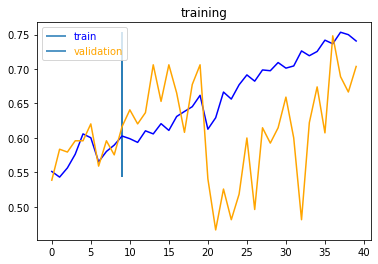

In [108]:
learn_acc = np.append(acc,acc2)
learn_acc = np.append(learn_acc,acc3)
learn_acc = np.append(learn_acc,acc4)
learn_val_acc = np.append(val_acc,val_acc2)
learn_val_acc = np.append(learn_val_acc,val_acc3)
learn_val_acc = np.append(learn_val_acc,val_acc4)

plt.vlines(np.array(acc).shape[0]-1,ymin=np.min(learn_acc), ymax=np.max(learn_acc))
plt.vlines(np.array(acc2).shape[0]-1,ymin=np.min(learn_acc), ymax=np.max(learn_acc))

plt.title("training")

plt.plot(learn_acc, color="blue")

plt.plot(learn_val_acc, color="orange")

plt.legend(["train", "validation"], labelcolor = ["blue", "orange"])

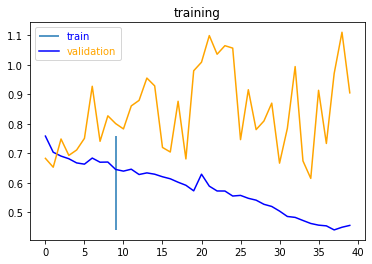

In [109]:
learn_loss = np.append(loss,loss2)
learn_loss = np.append(learn_loss,loss3)
learn_loss = np.append(learn_loss,loss4)

learn_val_loss = np.append(val_loss,val_loss2)
learn_val_loss = np.append(learn_val_loss,val_loss3)
learn_val_loss = np.append(learn_val_loss,val_loss4)

#plt.vlines(np.array(acc).shape[0]-1,ymin=np.min(learn_acc), ymax=np.max(learn_acc))
plt.vlines(np.array(loss2).shape[0]-1,ymin=np.min(learn_loss), ymax=np.max(learn_loss))

plt.title("training")

plt.plot(learn_loss, color="blue")

plt.plot(learn_val_loss, color="orange")

plt.legend(["train", "validation"], labelcolor = ["blue", "orange"])

In [110]:
acc_eval, loss_eval = evaluate(X_test, labels_test, model)

print("accuracy: ", acc_eval)
print("loss: ", loss_eval)

2022-05-28 00:26:26.826168: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_5', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


1/1 [==============================] - 0s 42ms/step - loss: 1.3297 - accuracy: 0.0000e+00
accuracy:  0.7037037037037037
loss:  0.9047547303621993


In [111]:
CLASSES_LIST2 = ["for_showing_ras", "for_showing_suspect"]

features_to_show, labels_to_show, video_files_paths = create_dataset(CLASSES_LIST2,DATASET_DIR)

Extracting Data of Class: for_showing_ras
Extracting Data of Class: for_showing_suspect


In [112]:
def predict(video, model):

    preds = []
    video_frames_count = video.shape[0]
    video = normalizeMobile(video)

    for count in range(int(video_frames_count / SEQUENCE_LENGTH)):

        batch = video[(count*SEQUENCE_LENGTH):((count+1)*SEQUENCE_LENGTH)]
        pred = model.predict(np.array([batch]))

    model.reset_states()

    preds.append(np.mean(pred))
        
    return preds

2022-05-28 00:29:11.475867: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:828] layout failed: INVALID_ARGUMENT: MutableGraphView::SortTopologically error: detected edge(s) creating cycle(s) {'Func/sequential/conv_lstm2d/while/body/_1/input/_68' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_10', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/Tanh_1' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/mul_13', 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/convolution_7' -> 'sequential/conv_lstm2d/while/body/_1/sequential/conv_lstm2d/while/add_6'}.


True label:  1.0
Prediction :  [0.9890792]


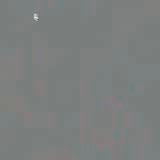

True label:  1.0
Prediction :  [0.34668612]


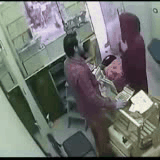

True label:  1.0
Prediction :  [0.2520186]


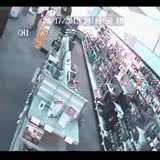

True label:  0.0
Prediction :  [0.45534283]


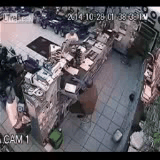

True label:  0.0
Prediction :  [0.17913267]


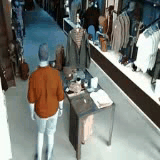

True label:  0.0
Prediction :  [0.10195154]


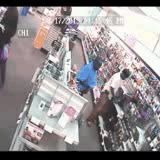

In [113]:
one_hot_encoded_labels = to_categorical(labels_to_show)
labels_to_show = one_hot_encoded_labels[:,0]

for i in range(len(features_to_show)):
    full_vid = frames_extraction(features_to_show[i])
    pred = predict(full_vid, model)
    imageio.mimsave("animation_real.gif",full_vid , fps=15)
    embed.embed_file("animation_real.gif")
    print("True label: ", labels_to_show[i])
    print("Prediction : ", pred)
    with open('animation_real.gif','rb') as f:
        display(Image(data=f.read(), format='png'))